# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

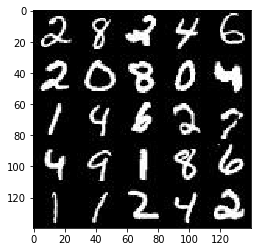

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

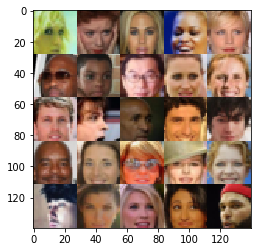

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.0.0
Default GPU Device: /gpu:0


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    real_input = tf.placeholder(tf.float32, (None, image_width, image_height, image_channels)
                                , name="real_inputs")
    fake_input = tf.placeholder(tf.float32, (None, z_dim), name="fake_inputs")
    lr = tf.placeholder(tf.float32, name="learning_rate")

    return real_input, fake_input, lr


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [8]:
alpha = 0.2     # alpha for leaky relu
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    istraining = True   # flag for batch normalization

    with tf.variable_scope("discriminator", reuse=reuse):
        # input 28*28*3
        # first conv layer, kernel 5, filters 64, strides 2
        # out 14*14*64
        # leaky relu activation, no pooling, no batch normalization
        x1 = tf.layers.conv2d(images, 64, 5, strides=2, padding='same'
                             , kernel_initializer=tf.contrib.layers.xavier_initializer())
        x1 = tf.maximum(alpha*x1, x1)

        # second conv layer, kernel 5, filters 128, strides 2
        # out 7*7*128
        # leaky relu activation, no pooling, with batch normalization
        x2 = tf.layers.conv2d(x1, 128, 5, strides=2, padding='same'
                             , kernel_initializer=tf.contrib.layers.xavier_initializer())
        x2 = tf.layers.batch_normalization(x2, training=istraining)
        x2 = tf.maximum(alpha*x2, x2)

        # third conv layer, kernel 5, filters 256, strides 2
        # out 4*4*256
        # leaky relu activation, no pooling, with batch normalization
        x3 = tf.layers.conv2d(x2, 256, 5, strides=2, padding='same'
                             , kernel_initializer=tf.contrib.layers.xavier_initializer())
        x3 = tf.layers.batch_normalization(x3, training=istraining)
        x3 = tf.maximum(alpha*x2, x2)

        # flatten for fully connected output
        # output 1 neuron sigmoid
        flat = tf.reshape(x3, (-1, 4*4*256))
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)

    return out, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [7]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    with tf.variable_scope('generator', reuse=not is_train):
        # fully connected layer input
        # output 4*4*512
        x1 = tf.layers.dense(z, 4*4*512)

        #reshape
        x1 = tf.reshape(x1, (-1, 4, 4, 512))
        # first transpose conv layer 5 kernel, 256 filters, strides 2
        # output 7*7*256
        # batch norm and leaky relu activation
        x2 = tf.layers.conv2d_transpose(x1, 256, 4, strides=1, padding='valid'
                                       , kernel_initializer=tf.contrib.layers.xavier_initializer())
        x2 = tf.layers.batch_normalization(x2, training=is_train)
        x2 = tf.maximum(alpha*x2, x2)

        # second transpose conv layer 5 kernel, 128 filters, strides 2
        # output 14*14*128
        # batch norm and leaky relu
        x3 = tf.layers.conv2d_transpose(x2, 192, 5, strides=2, padding='same'
                                       , kernel_initializer=tf.contrib.layers.xavier_initializer())
        x3 = tf.layers.batch_normalization(x3, training=is_train)
        x3 = tf.maximum(alpha*x3, x3)
        
        x3 = tf.layers.conv2d_transpose(x3, 128, 5, strides=1, padding='same'
                                       , kernel_initializer=tf.contrib.layers.xavier_initializer())
        x3 = tf.layers.batch_normalization(x3, training=is_train)
        x3 = tf.maximum(alpha*x3, x3)

        # output conv layer 5 kernel, 3 filters, strides 2
        # output 28*28*3
        # tanh out
        logits = tf.layers.conv2d_transpose(x3, out_channel_dim, 5, strides=2, padding='same'
                                           , kernel_initializer=tf.contrib.layers.xavier_initializer())
        out = tf.tanh(logits)
    
    return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [9]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    g_model = generator(input_z, out_channel_dim, is_train=True)
    d_model_real, d_logits_real = discriminator(input_real, reuse=False)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)

    d_loss_real = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits
                                 (logits=d_logits_real, labels=tf.ones_like(d_model_real)))
    d_loss_fake = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits
                                 (logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits
                            (logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_fake + d_loss_real
    
    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [10]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # get weights and biases for the model
    # split into discriminator and generator variables
    model_variables = tf.trainable_variables()
    discriminator_variables = [var for var in model_variables if var.name.startswith('discriminator')]
    generator_variables = [var for var in model_variables if var.name.startswith('generator')]

    # optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        discriminator_optimizer = tf.train.AdamOptimizer(learning_rate, beta1).minimize(
            d_loss, var_list=discriminator_variables)
        generator_optimizer = tf.train.AdamOptimizer(learning_rate, beta1).minimize(
            g_loss, var_list=generator_variables)
    
    return discriminator_optimizer, generator_optimizer


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [11]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [19]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    tf.reset_default_graph()
    
    sample_z = np.random.uniform(-0.5, 0.5, (64, z_dim))
    samples, losses = [], []
    steps = 0
    print_every = 50

    input_real, input_fake, lr = model_inputs(data_shape[1], data_shape[2], data_shape[3], z_dim)

    d_loss, g_loss = model_loss(input_real, input_fake, data_shape[3])

    d_opt, g_opt = model_opt(d_loss, g_loss, lr, beta1)
    
    saver = tf.train.Saver()
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                steps += 1
                # sample noize for generator input
                batch_z = np.random.uniform(-1, 1, (batch_size, z_dim))

                # run optimizers
                _ = sess.run(d_opt, feed_dict={input_real: batch_images, input_fake: batch_z, lr: learning_rate})
                # test with one pass, then add passes if necessary
                _ = sess.run(g_opt, feed_dict={input_fake: batch_z, input_real: batch_images, lr: learning_rate})
                batch_z = np.random.uniform(-1, 1, (batch_size, z_dim))
                _ = sess.run(g_opt, feed_dict={input_fake: batch_z, input_real: batch_images, lr: learning_rate})
                #_ = sess.run(g_opt, feed_dict={input_fake: batch_z, input_real: batch_images, lr: learning_rate})

                if steps % print_every == 0:
                    train_loss_d = d_loss.eval({input_fake: batch_z, input_real: batch_images})
                    train_loss_g = g_loss.eval({input_fake: batch_z})

                    show_generator_output(sess, 64, input_fake, data_shape[3], data_image_mode)
                    print("Epoch {}/Step {}...".format(epoch_i+1, steps),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    losses.append((train_loss_d, train_loss_g))

        print("training done!")
        saver.save(sess, './checkpoints/generator.ckpt')
        print("model saved!")
                
                

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

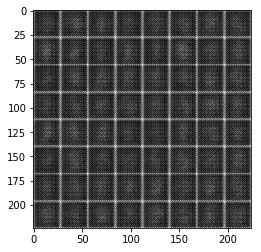

Epoch 1/Step 50... Discriminator Loss: 1.2329... Generator Loss: 0.6825


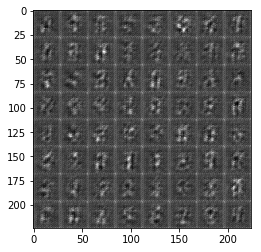

Epoch 1/Step 100... Discriminator Loss: 1.3410... Generator Loss: 0.6657


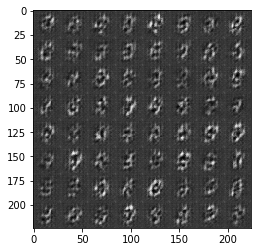

Epoch 1/Step 150... Discriminator Loss: 1.3037... Generator Loss: 0.6986


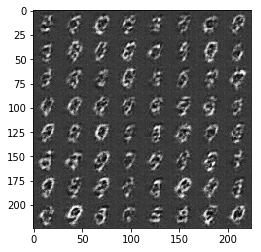

Epoch 1/Step 200... Discriminator Loss: 1.2440... Generator Loss: 0.7330


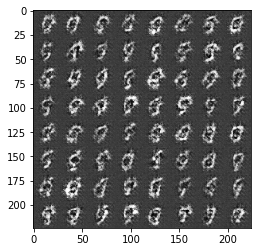

Epoch 1/Step 250... Discriminator Loss: 1.1550... Generator Loss: 0.7993


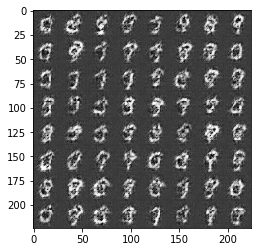

Epoch 1/Step 300... Discriminator Loss: 1.1009... Generator Loss: 0.7412


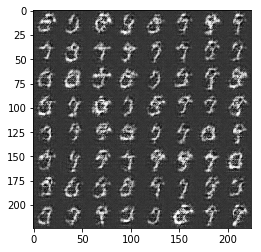

Epoch 1/Step 350... Discriminator Loss: 1.0508... Generator Loss: 0.8359


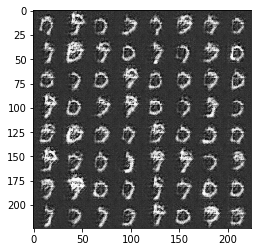

Epoch 1/Step 400... Discriminator Loss: 0.9620... Generator Loss: 0.9106


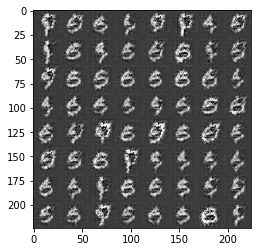

Epoch 1/Step 450... Discriminator Loss: 0.8647... Generator Loss: 1.1030


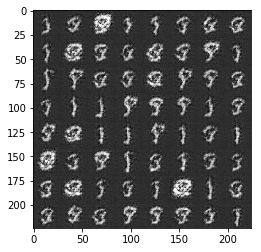

Epoch 1/Step 500... Discriminator Loss: 0.9571... Generator Loss: 0.8516


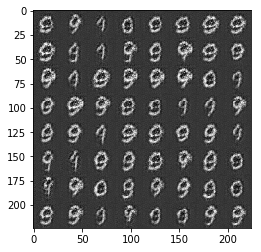

Epoch 1/Step 550... Discriminator Loss: 0.8083... Generator Loss: 1.5591


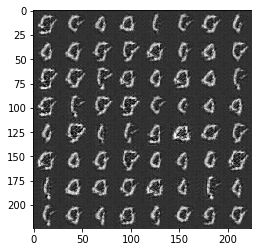

Epoch 1/Step 600... Discriminator Loss: 0.8740... Generator Loss: 0.9566


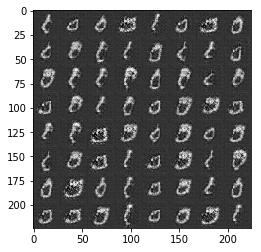

Epoch 1/Step 650... Discriminator Loss: 0.9500... Generator Loss: 1.2353


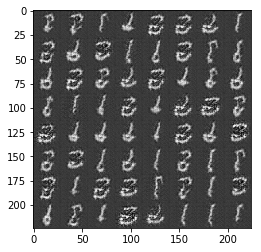

Epoch 1/Step 700... Discriminator Loss: 0.8182... Generator Loss: 1.1187


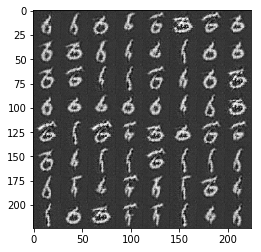

Epoch 1/Step 750... Discriminator Loss: 0.8398... Generator Loss: 1.1473


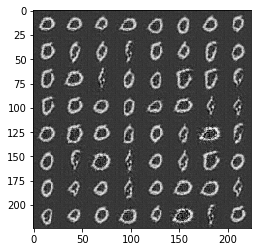

Epoch 1/Step 800... Discriminator Loss: 0.7741... Generator Loss: 1.6460


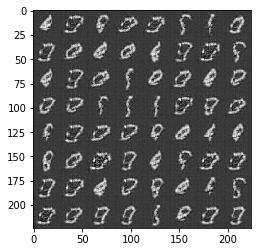

Epoch 1/Step 850... Discriminator Loss: 0.9702... Generator Loss: 0.9931


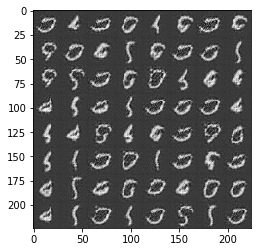

Epoch 1/Step 900... Discriminator Loss: 0.9005... Generator Loss: 1.4320


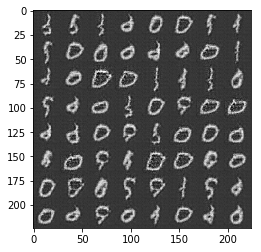

Epoch 2/Step 950... Discriminator Loss: 0.8403... Generator Loss: 1.1113


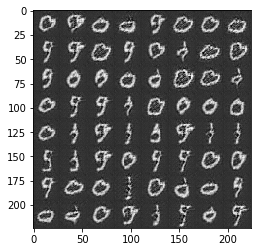

Epoch 2/Step 1000... Discriminator Loss: 0.8827... Generator Loss: 1.1375


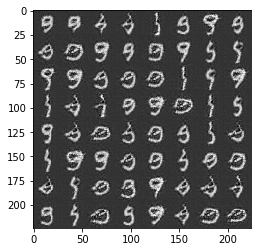

Epoch 2/Step 1050... Discriminator Loss: 0.9444... Generator Loss: 0.8390


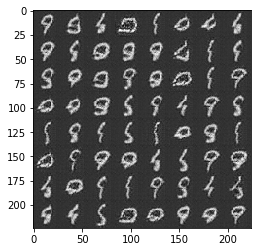

Epoch 2/Step 1100... Discriminator Loss: 0.8765... Generator Loss: 1.3629


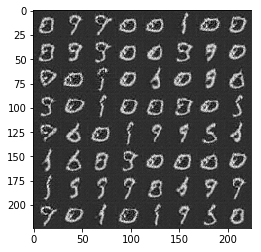

Epoch 2/Step 1150... Discriminator Loss: 0.9262... Generator Loss: 0.9060


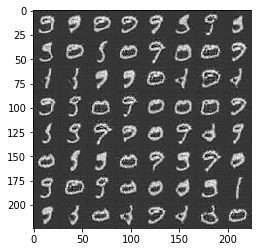

Epoch 2/Step 1200... Discriminator Loss: 0.8401... Generator Loss: 1.4545


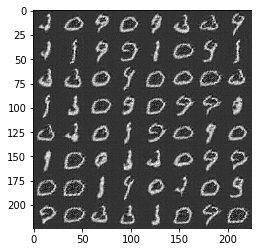

Epoch 2/Step 1250... Discriminator Loss: 0.9354... Generator Loss: 0.8261


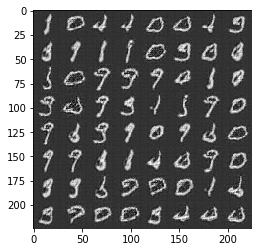

Epoch 2/Step 1300... Discriminator Loss: 0.7843... Generator Loss: 1.3932


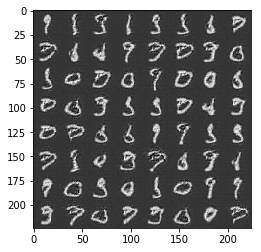

Epoch 2/Step 1350... Discriminator Loss: 0.9780... Generator Loss: 0.8339


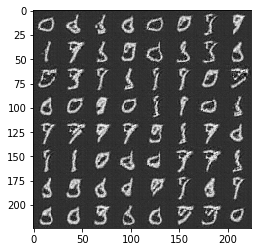

Epoch 2/Step 1400... Discriminator Loss: 0.8311... Generator Loss: 0.9813


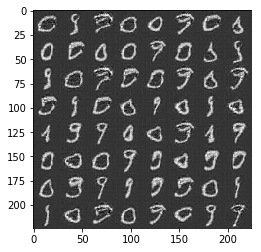

Epoch 2/Step 1450... Discriminator Loss: 0.9194... Generator Loss: 0.7663


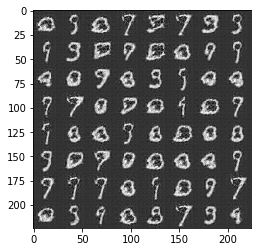

Epoch 2/Step 1500... Discriminator Loss: 0.6752... Generator Loss: 1.4968


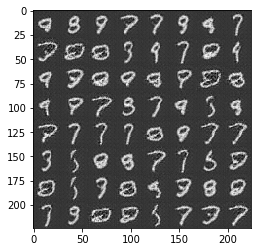

Epoch 2/Step 1550... Discriminator Loss: 0.8948... Generator Loss: 1.2639


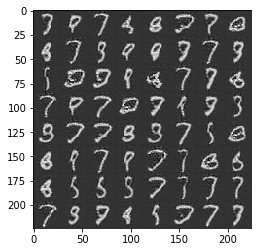

Epoch 2/Step 1600... Discriminator Loss: 0.9131... Generator Loss: 1.6102


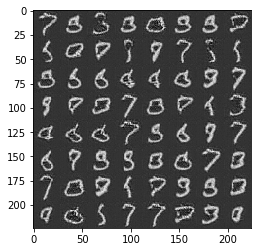

Epoch 2/Step 1650... Discriminator Loss: 0.9280... Generator Loss: 0.8097


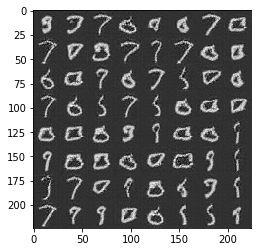

Epoch 2/Step 1700... Discriminator Loss: 0.9272... Generator Loss: 1.3360


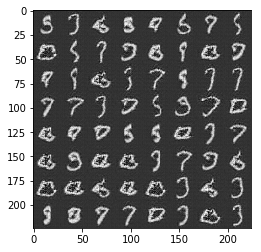

Epoch 2/Step 1750... Discriminator Loss: 0.7339... Generator Loss: 1.8126


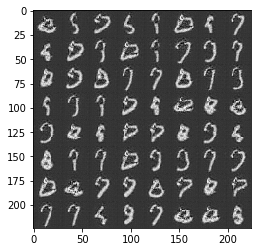

Epoch 2/Step 1800... Discriminator Loss: 0.7260... Generator Loss: 1.3427


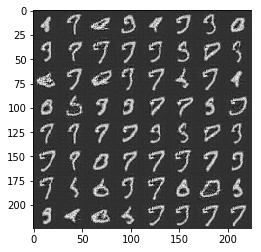

Epoch 2/Step 1850... Discriminator Loss: 0.7596... Generator Loss: 1.3574
training done!


IndexError: list index out of range

In [18]:
batch_size = 64
z_dim = 100
learning_rate = 0.0002
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

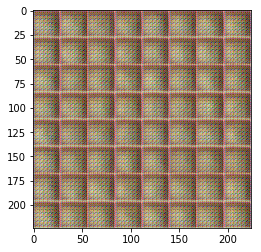

Epoch 1/Step 50... Discriminator Loss: 1.2737... Generator Loss: 0.6953


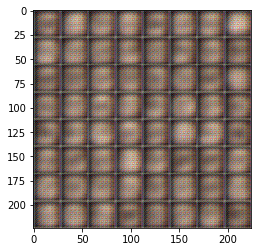

Epoch 1/Step 100... Discriminator Loss: 1.1334... Generator Loss: 0.8482


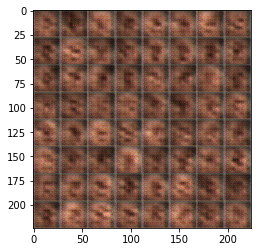

Epoch 1/Step 150... Discriminator Loss: 1.2618... Generator Loss: 0.7293


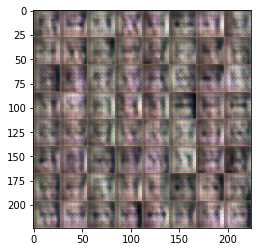

Epoch 1/Step 200... Discriminator Loss: 1.3436... Generator Loss: 0.6144


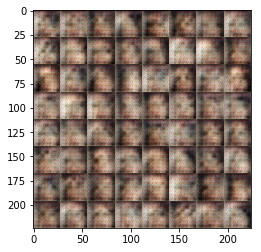

Epoch 1/Step 250... Discriminator Loss: 1.0707... Generator Loss: 0.7509


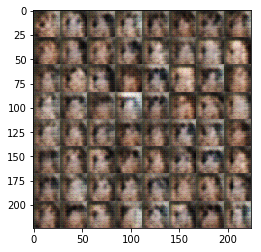

Epoch 1/Step 300... Discriminator Loss: 0.7427... Generator Loss: 1.5081


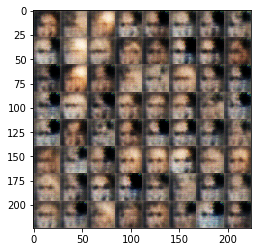

Epoch 1/Step 350... Discriminator Loss: 0.4328... Generator Loss: 2.1709


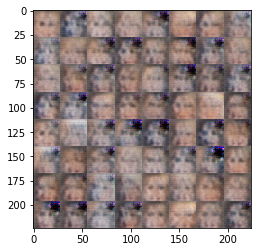

Epoch 1/Step 400... Discriminator Loss: 1.1674... Generator Loss: 0.7050


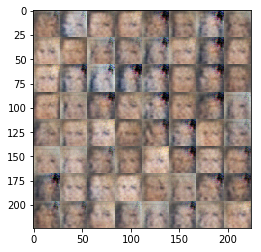

Epoch 1/Step 450... Discriminator Loss: 1.3126... Generator Loss: 0.6522


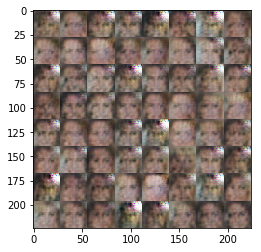

Epoch 1/Step 500... Discriminator Loss: 1.0544... Generator Loss: 1.0335


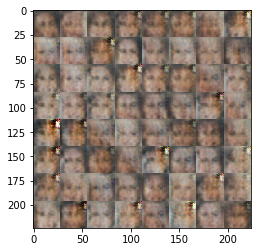

Epoch 1/Step 550... Discriminator Loss: 1.2616... Generator Loss: 0.7457


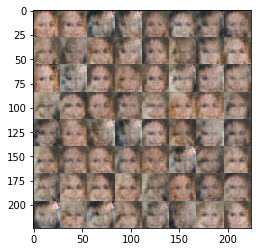

Epoch 1/Step 600... Discriminator Loss: 1.3115... Generator Loss: 0.7366


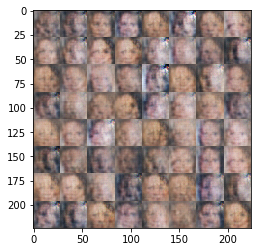

Epoch 1/Step 650... Discriminator Loss: 1.1350... Generator Loss: 0.9758


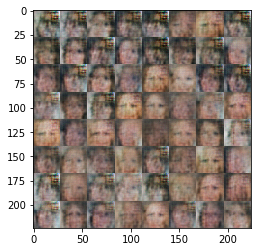

Epoch 1/Step 700... Discriminator Loss: 1.2016... Generator Loss: 1.0493


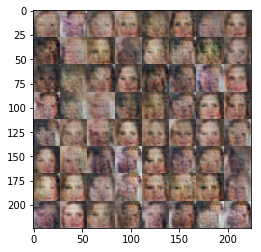

Epoch 1/Step 750... Discriminator Loss: 1.4301... Generator Loss: 0.6421


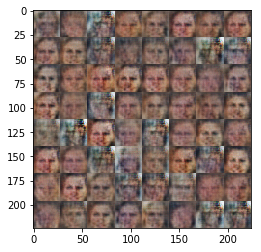

Epoch 1/Step 800... Discriminator Loss: 1.2393... Generator Loss: 0.5723


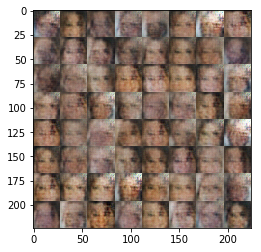

Epoch 1/Step 850... Discriminator Loss: 1.2569... Generator Loss: 0.7638


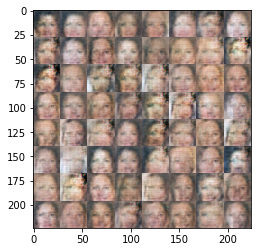

Epoch 1/Step 900... Discriminator Loss: 1.4015... Generator Loss: 0.5870


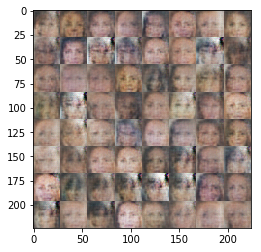

Epoch 1/Step 950... Discriminator Loss: 1.3615... Generator Loss: 0.5598


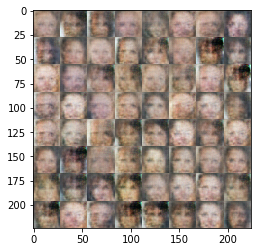

Epoch 1/Step 1000... Discriminator Loss: 1.3413... Generator Loss: 0.6585


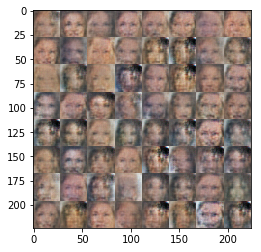

Epoch 1/Step 1050... Discriminator Loss: 1.2186... Generator Loss: 0.5646


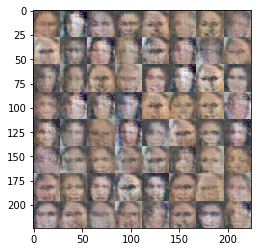

Epoch 1/Step 1100... Discriminator Loss: 1.1691... Generator Loss: 0.7264


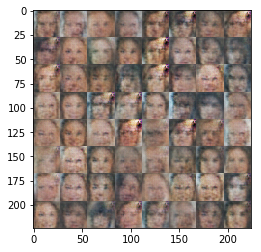

Epoch 1/Step 1150... Discriminator Loss: 1.1097... Generator Loss: 1.0167


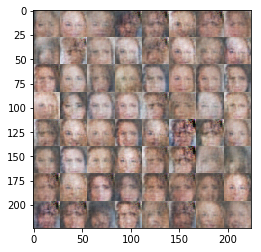

Epoch 1/Step 1200... Discriminator Loss: 1.2542... Generator Loss: 0.6374


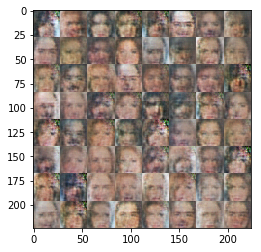

Epoch 1/Step 1250... Discriminator Loss: 1.2705... Generator Loss: 0.7080


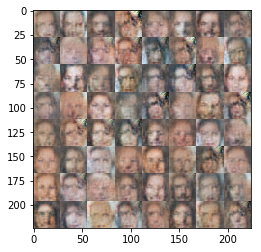

Epoch 1/Step 1300... Discriminator Loss: 1.3001... Generator Loss: 0.7634


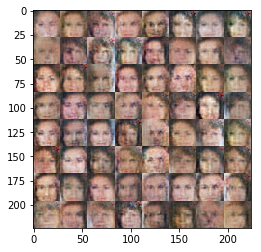

Epoch 1/Step 1350... Discriminator Loss: 1.1766... Generator Loss: 0.9748


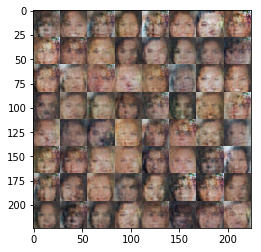

Epoch 1/Step 1400... Discriminator Loss: 1.2215... Generator Loss: 1.3148


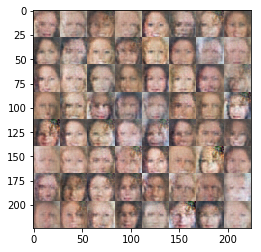

Epoch 1/Step 1450... Discriminator Loss: 1.3581... Generator Loss: 0.7137


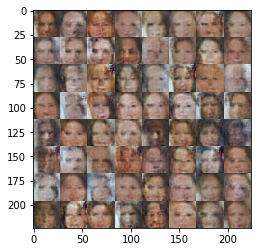

Epoch 1/Step 1500... Discriminator Loss: 1.0899... Generator Loss: 0.9706


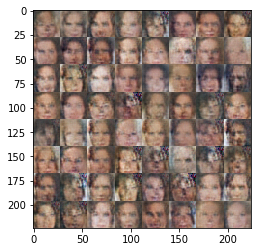

Epoch 1/Step 1550... Discriminator Loss: 0.9994... Generator Loss: 1.6701


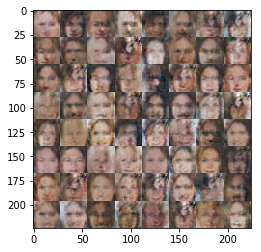

Epoch 1/Step 1600... Discriminator Loss: 1.1851... Generator Loss: 0.9627


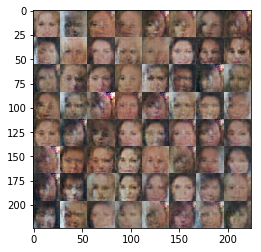

Epoch 1/Step 1650... Discriminator Loss: 1.4015... Generator Loss: 0.5530


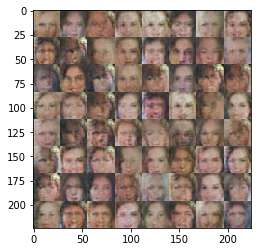

Epoch 1/Step 1700... Discriminator Loss: 1.2021... Generator Loss: 0.9214


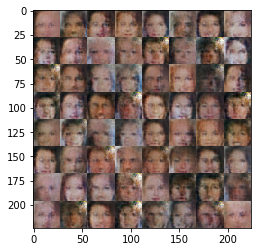

Epoch 1/Step 1750... Discriminator Loss: 1.4567... Generator Loss: 0.6939


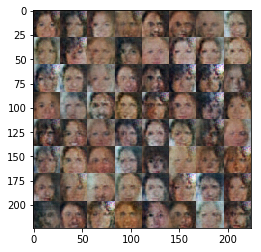

Epoch 1/Step 1800... Discriminator Loss: 1.3116... Generator Loss: 0.6384


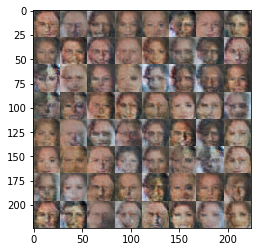

Epoch 1/Step 1850... Discriminator Loss: 1.4636... Generator Loss: 0.5198


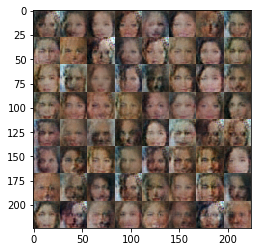

Epoch 1/Step 1900... Discriminator Loss: 0.9691... Generator Loss: 1.8902


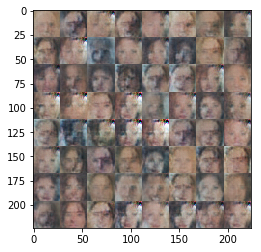

Epoch 1/Step 1950... Discriminator Loss: 1.1369... Generator Loss: 0.9430


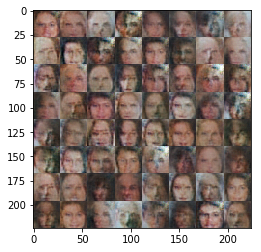

Epoch 1/Step 2000... Discriminator Loss: 1.4433... Generator Loss: 0.6201


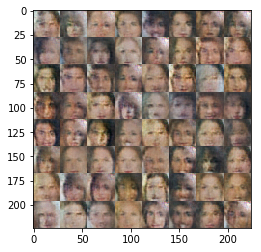

Epoch 1/Step 2050... Discriminator Loss: 1.0446... Generator Loss: 1.1966


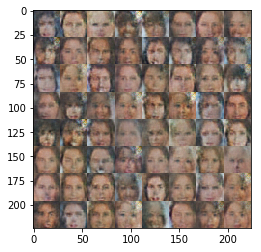

Epoch 1/Step 2100... Discriminator Loss: 1.1668... Generator Loss: 1.2811


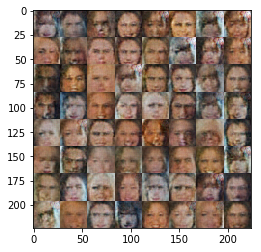

Epoch 1/Step 2150... Discriminator Loss: 1.2391... Generator Loss: 1.0634


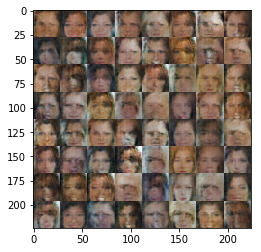

Epoch 1/Step 2200... Discriminator Loss: 1.3462... Generator Loss: 0.7766


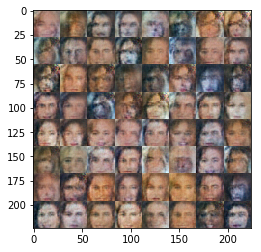

Epoch 1/Step 2250... Discriminator Loss: 1.3969... Generator Loss: 0.6608


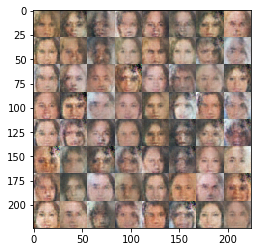

Epoch 1/Step 2300... Discriminator Loss: 1.4033... Generator Loss: 0.5959


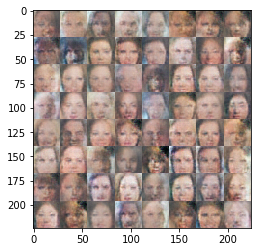

Epoch 1/Step 2350... Discriminator Loss: 1.3920... Generator Loss: 0.6443


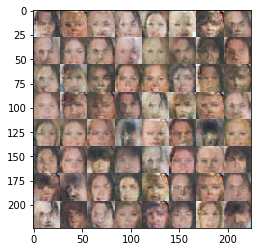

Epoch 1/Step 2400... Discriminator Loss: 1.2380... Generator Loss: 0.9225


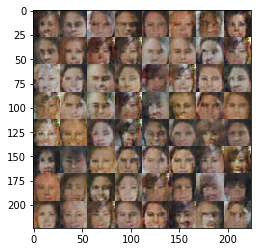

Epoch 1/Step 2450... Discriminator Loss: 1.2500... Generator Loss: 0.9332


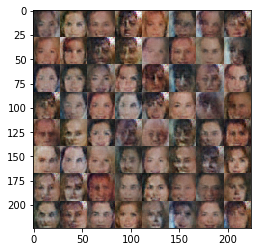

Epoch 1/Step 2500... Discriminator Loss: 1.3046... Generator Loss: 0.6505


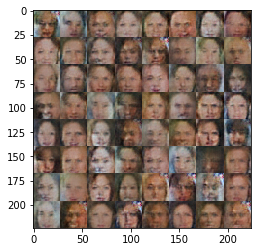

Epoch 1/Step 2550... Discriminator Loss: 1.4187... Generator Loss: 0.6273


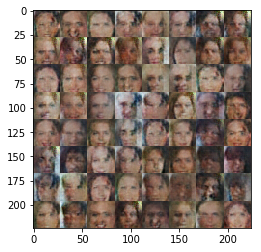

Epoch 1/Step 2600... Discriminator Loss: 1.3312... Generator Loss: 0.6428


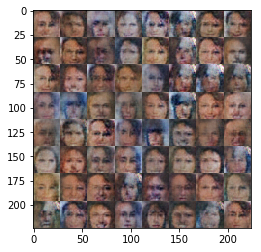

Epoch 1/Step 2650... Discriminator Loss: 1.3471... Generator Loss: 0.7604


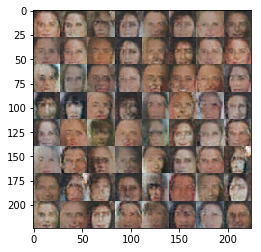

Epoch 1/Step 2700... Discriminator Loss: 1.3817... Generator Loss: 0.6820


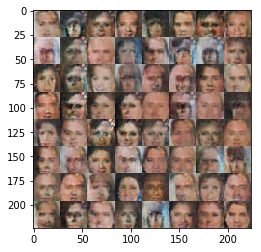

Epoch 1/Step 2750... Discriminator Loss: 1.1908... Generator Loss: 1.1286


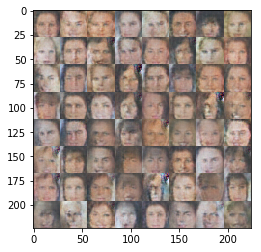

Epoch 1/Step 2800... Discriminator Loss: 1.4378... Generator Loss: 0.5514


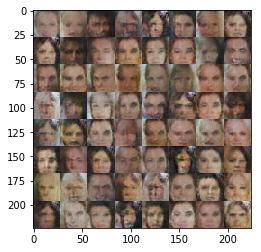

Epoch 1/Step 2850... Discriminator Loss: 1.3712... Generator Loss: 0.7545


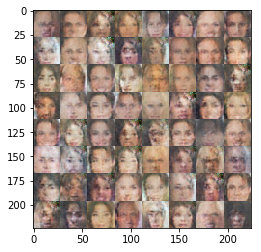

Epoch 1/Step 2900... Discriminator Loss: 1.2004... Generator Loss: 1.1804


In [ ]:
batch_size = 64
z_dim = 100
learning_rate = 0.0002
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.